# Predict Car Accident Severity
**IBM/Coursera Applied Data Science Capstone**

*Artemi Glazkov*

*2020*

## Table of Contents

## Introduction

This work is the final submission of the IBM Data Science Certification course by Courseria. The project aims to demonstrate an approach to solving a business problem by means of CRISP-DM methodology (Cross-industry standard process for data mining)

The project is a part of the author's learning process and does not aim to explore all possible approaches to finding the most optimal solution. It is broadly limited to topics discussed in training materials of the course. 

## Business Problem

Traffic accidents represent on of the leading causes of death, injuries and economic loses. 
According to the Word Health Organisation (WHO) [1] approximately 1.35 million people die each year as a result of road traffic accidents. More than half of all road traffic deaths worldwide are among vulnerable road users: pedestrians, cyclists and motorcyclists. Road traffic injuries are the leading cause of deaths for children and young adults age 5-29 years.

There are several risk factors associated with road accidents. One of the factors is inadequate post-crash care. WHO says [1]: 

"Delays in detecting and providing care for those involved in a road traffic crash increase the severity of injuries. Care of injuries after a crash has occurred is extremely time-sensitive: delays of minutes can make the difference between life and death. Improving post-crash care requires ensuring access to timely prehospital care, and improving the quality of both prehospital and hospital care, such as through specialist training programmes."  

This project employs Data Science methods to improve the quality of the post-crash care. In particular it aims to provide an estimation of an accident severity prior to in-situ assessment done by the emergency response teams. 

When a call about a road traffic accident is received by the Emergency Services call center, its severity is not always known. Thus a delay in providing an adequate medical support may occur resulting into excessive post-crush deaths, longer recovery period etc. 

In this project we aim to predict the accidents severity based on the information available at the moment of the emergency call reception. 

[1] https://www.who.int/news-room/fact-sheets/detail/road-traffic-injuries

## Data 

We will use the data set provided by Courseria as part of the course syllabus. The data set is a police record of approximately 200000 road accidents in Seattle, Washington, US between the beginning of 2004 and the first quarter of 2020. 

Data set location: https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv

Data set metadata: https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Metadata.pdf

Due to the limited nature of this project no other data sources will be used. However, it has to be noted that further improvements may be achieved by employing some sort of geo-spacial categorisation based for example on district borders or points of interest (POI) such as the transit system stops. We did not attempt to perform such analysis here. 

The following subsections describe steps taken to load and clean the data set in preparation to further analysis. 

### Import Libraries

First, import of necessary libraries to be used in this notebook.

In [2]:
#Import all the packages to be used in this notebook 

#Analysis
import pandas as pd
import numpy as np

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import branca

#Data Modelling
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN

#Resul Evaluation
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report 
from sklearn.metrics import precision_score

%matplotlib inline

### Loading Data

The data set can be loaded directly from a cloud location provided by Coursera.

In [77]:
#Uncomment to load the data file directly from the cloud location.
#!wget -O Data-Collisions.csv https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv

In [80]:
df = pd.read_csv('Data-Collisions.csv')

C:\Users\Artemi\.conda\envs\MyEnvironment\lib\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [79]:
df.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [72]:
#List available features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

In [81]:
df.shape

(194673, 38)

The data set consists of one label field, SEVERITYCODE, and 37 features and contains almost 200000 records.

The metadata description of the data set refers to 5 different values of the SEVERITYCODE:

* 3—fatality
* 2b—serious injury
* 2—injury
* 1—prop damage
* 0—unknown

However, it appears that only two values, 1 and 2, are present in the provided data.

In [82]:
df['SEVERITYCODE'].unique()

array([2, 1], dtype=int64)

### Preparing Data

The following two steps will be be taken to prepare the data set for further analysis:

* Accounting for missing values
* Formating Time/Data stamps

#### Accounting for Missing Values

The following heatmap visualises values missing in the dataset (yellow).

<AxesSubplot:>

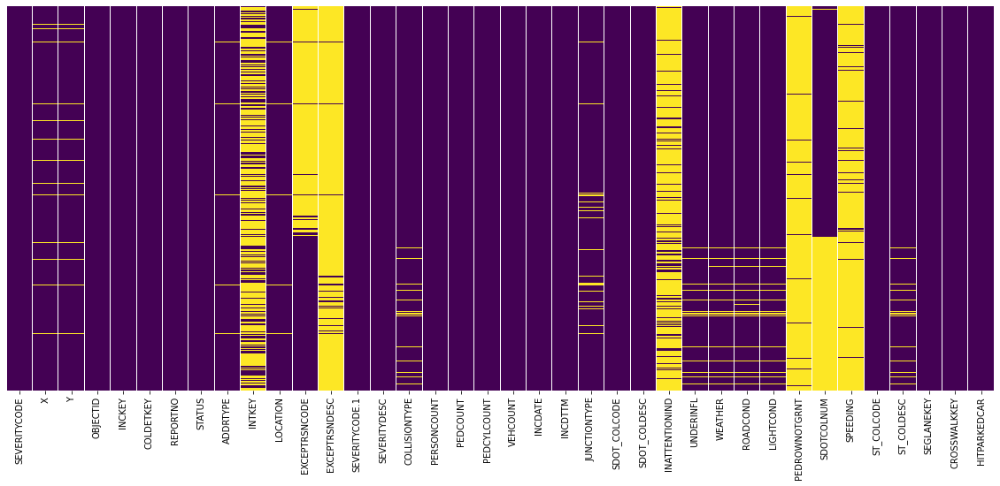

In [83]:
#DF missing values heatmap
plt.figure(figsize=(20,8))
sns.heatmap(df.isna(),
            yticklabels=False,
            cbar=False,
            cmap='viridis')

The following records will be removed from the dataset:

* Any columns where more than 25% of records are missing. With such large percentage it would be  difficult to recover any information. 
* Records without geo-coordinates (X,Y). Spacial location of a record is an important part of the analysis envisaged by the author. 
* Missing records from columns WEATHER, ROADCOND, LIGHTCOND. These three features represent information about conditions that can possible contribute to the accidents and thus important for both analysis and modeling. 




In [84]:
# Drop columns where the amount of missing values is over the specified threshold
na_threshold = 25 # percentage of missing values threshold

for col in df.columns:
    na_pct = 100*df[col].isna().sum()/len(df[col])
    if na_pct >na_threshold:
        df.drop(col,axis=1,inplace=True)
        print (col,'.....',na_pct,'.....will be removed')
    else:
        print (col,'.....',na_pct)

SEVERITYCODE ..... 0.0
X ..... 2.739979349986901
Y ..... 2.739979349986901
OBJECTID ..... 0.0
INCKEY ..... 0.0
COLDETKEY ..... 0.0
REPORTNO ..... 0.0
STATUS ..... 0.0
ADDRTYPE ..... 0.9893513738422893
INTKEY ..... 66.57471760336564 .....will be removed
LOCATION ..... 1.3751264941722787
EXCEPTRSNCODE ..... 56.43412286244112 .....will be removed
EXCEPTRSNDESC ..... 97.10386134697673 .....will be removed
SEVERITYCODE.1 ..... 0.0
SEVERITYDESC ..... 0.0
COLLISIONTYPE ..... 2.519096125297293
PERSONCOUNT ..... 0.0
PEDCOUNT ..... 0.0
PEDCYLCOUNT ..... 0.0
VEHCOUNT ..... 0.0
INCDATE ..... 0.0
INCDTTM ..... 0.0
JUNCTIONTYPE ..... 3.2510928582802956
SDOT_COLCODE ..... 0.0
SDOT_COLDESC ..... 0.0
INATTENTIONIND ..... 84.6897104375029 .....will be removed
UNDERINFL ..... 2.5088224869396374
WEATHER ..... 2.6100178247625507
ROADCOND ..... 2.5745737724286366
LIGHTCOND ..... 2.6557355154541207
PEDROWNOTGRNT ..... 97.60264648924094 .....will be removed
SDOTCOLNUM ..... 40.95945508622151 .....will be remo

In [85]:
# Drop records with missing X and Y
df.dropna(subset = ['X','Y'],inplace=True)

In [86]:
#Drop records with missing weather and road conditions information
df.dropna(subset = ['WEATHER','ROADCOND','LIGHTCOND'],inplace=True)

In [88]:
#Check for the remaining missing values
print('Percentage of missing records')
100*df.isna().sum()/len(df)

Percentage of missing records


SEVERITYCODE      0.000000
X                 0.000000
Y                 0.000000
OBJECTID          0.000000
INCKEY            0.000000
COLDETKEY         0.000000
REPORTNO          0.000000
STATUS            0.000000
ADDRTYPE          0.000000
LOCATION          0.000000
SEVERITYCODE.1    0.000000
SEVERITYDESC      0.000000
COLLISIONTYPE     0.011403
PERSONCOUNT       0.000000
PEDCOUNT          0.000000
PEDCYLCOUNT       0.000000
VEHCOUNT          0.000000
INCDATE           0.000000
INCDTTM           0.000000
JUNCTIONTYPE      2.215924
SDOT_COLCODE      0.000000
SDOT_COLDESC      0.000000
UNDERINFL         0.000000
WEATHER           0.000000
ROADCOND          0.000000
LIGHTCOND         0.000000
ST_COLCODE        0.009774
ST_COLDESC        0.011403
SEGLANEKEY        0.000000
CROSSWALKKEY      0.000000
HITPARKEDCAR      0.000000
dtype: float64

The remaining missing data are left unchanged at this stage. Further manipulations will be explained in later sections.

#### Time Stamps

Two features, INCDATE and INCDTTM, contain strings providing time stamps for records. There are to be formated accordingly. 

In [90]:
df[['INCDATE','INCDTTM']].head()

,INCDATE,INCDTTM
0,2013/03/27 00:00:00+00,3/27/2013 2:54:00 PM
1,2006/12/20 00:00:00+00,12/20/2006 6:55:00 PM
2,2004/11/18 00:00:00+00,11/18/2004 10:20:00 AM
3,2013/03/29 00:00:00+00,3/29/2013 9:26:00 AM
4,2004/01/28 00:00:00+00,1/28/2004 8:04:00 AM


In [91]:
df['INCDATE'] = pd.to_datetime(df['INCDATE'])
df['INCDTTM'] = pd.to_datetime(df['INCDTTM'])

In [93]:
df[['INCDATE','INCDTTM']].head()

,INCDATE,INCDTTM
0,2013-03-27 00:00:00+00:00,2013-03-27 14:54:00
1,2006-12-20 00:00:00+00:00,2006-12-20 18:55:00
2,2004-11-18 00:00:00+00:00,2004-11-18 10:20:00
3,2013-03-29 00:00:00+00:00,2013-03-29 09:26:00
4,2004-01-28 00:00:00+00:00,2004-01-28 08:04:00


New features are introduced to provide additional time references.

In [94]:
df['INC_YEAR']=df['INCDTTM'].apply(lambda x:x.year)
df['INC_MONTH']=df['INCDTTM'].apply(lambda x:x.month)
df['INC_WEEK']=df['INCDTTM'].apply(lambda x:x.week)
df['INC_DAYOFWEEK']=df['INCDTTM'].apply(lambda x:x.dayofweek)
df['INC_HOUR']=df['INCDTTM'].apply(lambda x:x.hour)

INCDTTM feature is dropped as the information is now duplicated in the new features.

In [95]:
df.drop('INCDTTM',axis=1, inplace=True)

In [3]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 184167 entries, 0 to 184166
Data columns (total 35 columns):
 #   Column          Non-Null Count   Dtype              
---  ------          --------------   -----              
 0   SEVERITYCODE    184167 non-null  int64              
 1   X               184167 non-null  float64            
 2   Y               184167 non-null  float64            
 3   OBJECTID        184167 non-null  int64              
 4   INCKEY          184167 non-null  int64              
 5   COLDETKEY       184167 non-null  int64              
 6   REPORTNO        184167 non-null  object             
 7   STATUS          184167 non-null  object             
 8   ADDRTYPE        184167 non-null  object             
 9   LOCATION        184167 non-null  object             
 10  SEVERITYCODE.1  184167 non-null  int64              
 11  SEVERITYDESC    184167 non-null  object             
 12  COLLISIONTYPE   184146 non-null  object             
 13  PERSONCOUNT   

#### Backup the  Data Frame

We reset the index and save the current state of the data frame to simplify running this notebook.

In [100]:
df.reset_index(inplace=True,drop=True)
df.to_csv('Data-Collisions_processed_stage_1.csv',index=False)

## Methodology 

In this project we will focus our effort on accurate classification of severe accidents (SEVERITYCODE =2). These are the accidents where delayed medical support may result into additional post-accident issues. 

First, we will analyse the data set focusing on finding any possible link between the severity of accidents and conditions in which they happened.

Secondly, we introduce locational clustering to capture possible correlation between accident locations and their severity. 

Finally, we design new features that will be used in modeling.

### Exploratory Data Analysis

We reload the processed data set

In [55]:
df = pd.read_csv('Data-Collisions_processed_stage_1.csv',parse_dates=['INCDATE'])

C:\Users\Artemi\.conda\envs\MyEnvironment\lib\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning: Columns (25) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Let us now have a closer look into the feature structure. Here is a record sample.

In [56]:
df.iloc[1]

SEVERITYCODE                                                      1
X                                                          -122.347
Y                                                           47.6472
OBJECTID                                                          2
INCKEY                                                        52200
COLDETKEY                                                     52200
REPORTNO                                                    2607959
STATUS                                                      Matched
ADDRTYPE                                                      Block
LOCATION                 AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N
SEVERITYCODE.1                                                    1
SEVERITYDESC                         Property Damage Only Collision
COLLISIONTYPE                                             Sideswipe
PERSONCOUNT                                                       2
PEDCOUNT                                        

The available features can be broadly segregated into several groups:
1. Time and Location of the accident that are known at the moment of the first registry. These are:
    * INCDATE, INC_HOUR, INC_DAY, INC_DAYOFWEEK, INC_MONTH, INC_YEAR
    * 'X', 'Y', LOCATION, ADDRESSTYPE
2. Weather conditions at the moment of the accident. These can usually be retrieved from the weather reporting system at the moment of the first registry thus prior to the emergency service arrival. This is:
    * WEATHER
3. Light conditions at the moment of the accident. These can be inferred from the accident time, the current season and location. Thus the feature can be populated at the moment of the first registry. This is:
    * LIGHTCOND
4. Road conditions that are more difficult to infer prior to in-situ assessment.However, it is probably reasonable to assume that with some degree of accuracy these can be assumed based on the weather conditions or extracted from a road safety system that may be available.  This is:
    * ROADCOND
5. All other features are populated during or after in-situ assessment and thus not suitable for the predictive modeling.

We will concentrate our analysis on features in the first four groups assuming that these are known or can be inferred at the moment of the first call. 

#### 'Naive behavior' estimation 

Let us now check how many different labels are in the data set. 

1    128154
2     56013
Name: SEVERITYCODE, dtype: int64


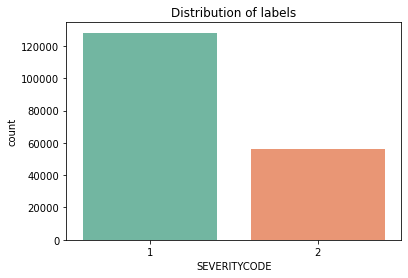

In [58]:
#specify colour palette for plots
mypalette = sns.color_palette("Set2")
sns.countplot(data=df,
              x ='SEVERITYCODE', 
              palette= mypalette)

plt.title('Distribution of labels')

print(df['SEVERITYCODE'].value_counts())


The dataset is imbalanced that may lead to a 'naive' outcome we should be aware of. In such case for example all samples with code 2 can be classified as code 1. The model precision for code 1 would be around 70%. In our case we target code 2 for which the 'naive' classification would provide around 30% precision.

To balance the data set we will use SMOTE (Synthetic Minority Oversampling TEchnique). It is outside the scope of this project to explore different re-balancing methods.

#### Yearly Variations

It appears that the number of accidents with severity code 1 is reducing, whereas the number of accidents with injuries remains relatively constant.

Text(0.5, 1.0, 'TBA')

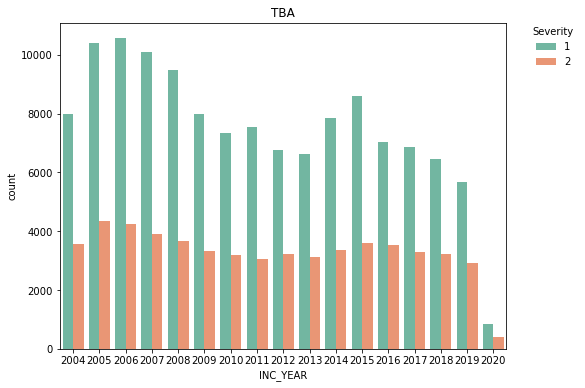

In [63]:
plt.figure(figsize=(8,6))
sns.countplot(data=df,
              x ='INC_YEAR',
              hue='SEVERITYCODE',
              palette= mypalette)

plt.legend(bbox_to_anchor=(1.05, 1), 
           loc='upper left', 
           borderaxespad=0., 
           frameon = False, 
           title = 'Severity')

plt.title('TBA')

This can be seen from the plot of a ratio between the number of samples with different codes.

Text(0.5, 1.0, 'Severity 1 to Severity 2 Ratio')

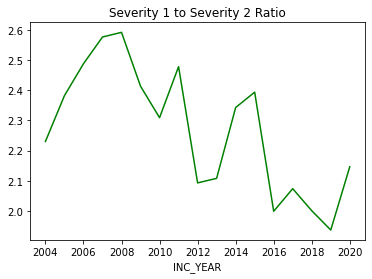

In [64]:
inc_code_1=df[df['SEVERITYCODE']==1].groupby(by=['INC_YEAR']).count()['SEVERITYCODE']
inc_code_2=df[df['SEVERITYCODE']==2].groupby(by=['INC_YEAR']).count()['SEVERITYCODE']
inc_code_1_ratio=inc_code_1/inc_code_2
inc_code_1_ratio.plot(kind='line',color='green')

plt.title('Severity 1 to Severity 2 Ratio')

This suggests that using the whole volume of the dataset may not be a correct way to follow. Thus we will limit the dataset to several previous years.

The reason for the number of accidents with injuries remaining relatively constant can partially be explained by  the high injury rate in accidents involving pedestrians and cyclists.
The below chart shows the number of accidents without injuries by the type of involved parties.

Text(0.5, 1.0, 'Severity 1 Accidents per Involved Parties')

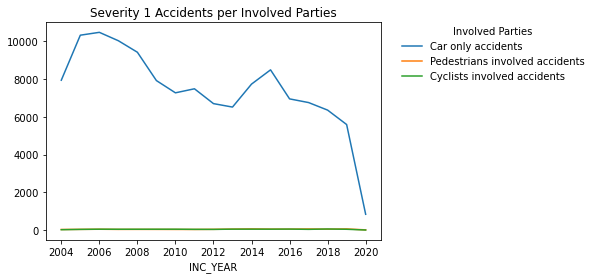

In [66]:
df[(df['PEDCOUNT']==0) &(df['PEDCYLCOUNT']==0)&(df['SEVERITYCODE']==1)].groupby(by=['INC_YEAR']).count()['SEVERITYCODE'].plot(label = 'Car only accidents')
df[(df['PEDCOUNT']>0) &(df['SEVERITYCODE']==1)].groupby(by=['INC_YEAR']).count()['SEVERITYCODE'].plot(label = 'Pedestrians involved accidents')
df[(df['PEDCYLCOUNT']>0)&(df['SEVERITYCODE']==1)].groupby(by=['INC_YEAR']).count()['SEVERITYCODE'].plot(label = 'Cyclists involved accidents')

plt.legend(bbox_to_anchor=(1.05, 1), 
           loc='upper left', 
           borderaxespad=0., 
           frameon = False, 
           title = 'Involved Parties')

plt.title('Severity 1 Accidents per Involved Parties')

Compare the above chart to the number of accidents with injuries shown below. 
The number of such accidents remains unchanged over the past 10 years with some increase in the number of accidents involving cyclists. 

Text(0.5, 1.0, 'Severity 2 Accidents per Involved Parties')

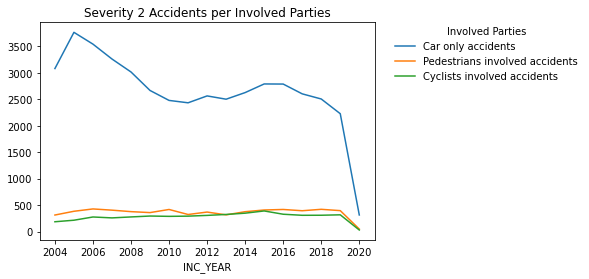

In [67]:
df[(df['PEDCOUNT']==0) &(df['PEDCYLCOUNT']==0)&(df['SEVERITYCODE']==2)].groupby(by=['INC_YEAR']).count()['SEVERITYCODE'].plot(label = 'Car only accidents')
df[(df['PEDCOUNT']>0) &(df['SEVERITYCODE']==2)].groupby(by=['INC_YEAR']).count()['SEVERITYCODE'].plot(label = 'Pedestrians involved accidents')
df[(df['PEDCYLCOUNT']>0)&(df['SEVERITYCODE']==2)].groupby(by=['INC_YEAR']).count()['SEVERITYCODE'].plot(label = 'Cyclists involved accidents')

plt.legend(bbox_to_anchor=(1.05, 1), 
           loc='upper left', 
           borderaxespad=0., 
           frameon = False, 
           title = 'Involved Parties')

plt.title('Severity 2 Accidents per Involved Parties')

#### Monthly Variations

We now look at changes in the total number of accidents over the course of the corresponding year.

Text(0.5, 1.0, 'Accident Yearly Variation')

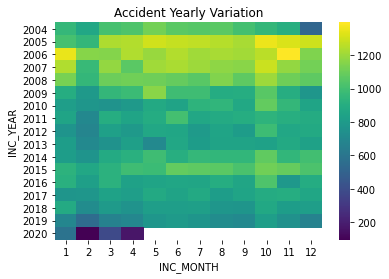

In [9]:

monthYear = df.groupby(by=['INC_YEAR','INC_MONTH']).count()['INCKEY'].unstack()
sns.heatmap(monthYear,cmap='viridis')
plt.title('Accident Yearly Variation')

Note in the above heatmap the change in the pattern in the past two...three years, from 2017 to 2019.

We will limit the further analysis to these three year excluding 2020 as it is incomplete and somewhat abnormal due to the COVID19 epidemic. 

In [68]:
filter_year = [2017,2018,2019] 

A distinct weekday-weekend pattern to the volume of accidents can be observed in 11 months of the year with somewhat different pattern in December. 

Text(0.5, 1.0, 'Number of Accident Monthly Variation')

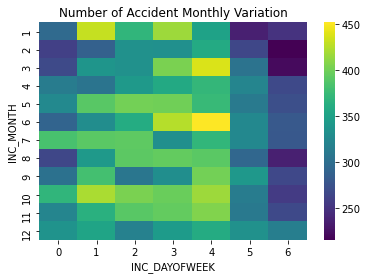

In [69]:

dayMonth = df[df['INC_YEAR'].isin(filter_year)].groupby(by=['INC_MONTH','INC_DAYOFWEEK']).count()['INCKEY'].unstack()
sns.heatmap(dayMonth,cmap='viridis')
plt.title('Number of Accident Monthly Variation')

At the same time the relative proportion of accidents with injuries is less obvious if at all.

Text(0.5, 1.0, 'Accident Severity Ratio Monthly Variation')

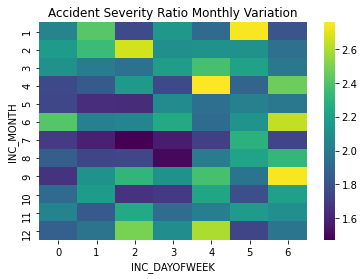

In [70]:
dayMonth_1 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)].groupby(by=['INC_MONTH','INC_DAYOFWEEK']).count()['INCKEY'].unstack()
dayMonth_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['INC_MONTH','INC_DAYOFWEEK']).count()['INCKEY'].unstack()

sns.heatmap(dayMonth_1/dayMonth_2,cmap='viridis')
plt.title('Accident Severity Ratio Monthly Variation')

#### Weekly Variations

A pattern similar to the monthly variation described above can be observed in the weekly data.

Text(0.5, 1.0, 'Number of Accident Weekly Variation')

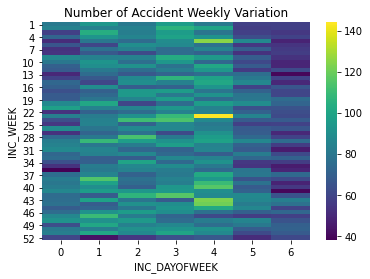

In [71]:
dayWeek = df[df['INC_YEAR'].isin(filter_year)].groupby(by=['INC_WEEK','INC_DAYOFWEEK']).count()['INCKEY'].unstack()
sns.heatmap(dayWeek,cmap='viridis')
plt.title('Number of Accident Weekly Variation')

Text(0.5, 1.0, 'Accident Severity Ratio Weekly Variation')

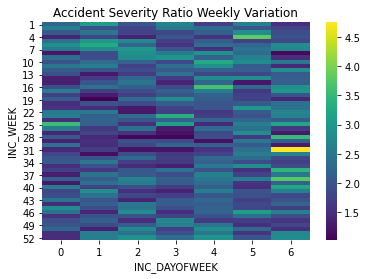

In [72]:
dayWeek_1 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)].groupby(by=['INC_WEEK','INC_DAYOFWEEK']).count()['INCKEY'].unstack()
dayWeek_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['INC_WEEK','INC_DAYOFWEEK']).count()['INCKEY'].unstack()

sns.heatmap(dayWeek_1/dayWeek_2,cmap='viridis')
plt.title('Accident Severity Ratio Weekly Variation')

#### Hourly Variations

A very distinct variation in both the number of accidents and the number of accidents with injuries can be observed if we slice the data by hour and week days.

Text(0.5, 1.0, 'Number of Accident Hourly Variation')

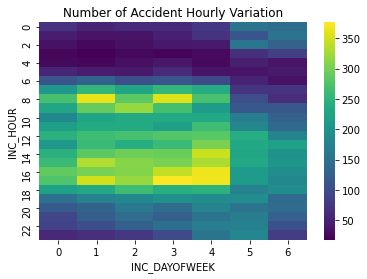

In [73]:
hourDay = df[df['INC_YEAR'].isin(filter_year)].groupby(by=['INC_HOUR','INC_DAYOFWEEK']).count()['INCKEY'].unstack()
sns.heatmap(hourDay,cmap='viridis')
plt.title('Number of Accident Hourly Variation')

Text(0.5, 1.0, 'Accident Severity Ratio Hourly Variation')

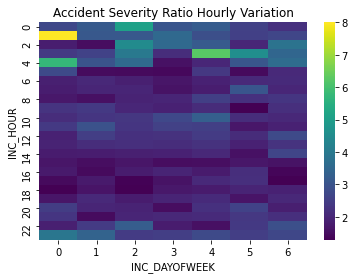

In [74]:
hourDay_1 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)].groupby(by=['INC_HOUR','INC_DAYOFWEEK']).count()['INCKEY'].unstack()
hourDay_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['INC_HOUR','INC_DAYOFWEEK']).count()['INCKEY'].unstack()

sns.heatmap(hourDay_1/hourDay_2,cmap='viridis')
plt.title('Accident Severity Ratio Hourly Variation')

#### Conditions During The Accident

We now look into a relation between different types of accidents depending upon various weather, road and light conditions.

Note: the charts below calculate Ration as Code2/(Code1+Code2), where Code1 and Code2 are the volumes for SEVERITYCODE =1 and SEVERITYCODE=2 respectively.  

Text(0.5, 1.0, 'Accident Severity Code 2 Ratio per Weather Conditions')

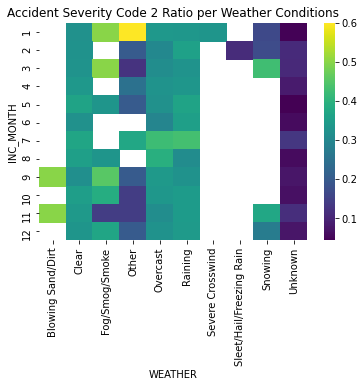

In [75]:
weatherMonth_1 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)].groupby(by=['INC_MONTH','WEATHER']).count()['INCKEY'].unstack()
weatherMonth_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['INC_MONTH','WEATHER']).count()['INCKEY'].unstack()

sns.heatmap(weatherMonth_2/(weatherMonth_1+weatherMonth_2),cmap='viridis')
plt.title('Accident Severity Code 2 Ratio per Weather Conditions')

Text(0.5, 1.0, 'Accident Severity Code 2 Ration per Road Conditions')

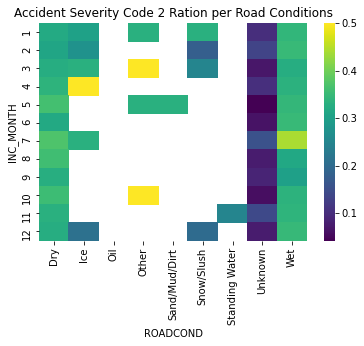

In [76]:
roadcondMonth_1 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)].groupby(by=['INC_MONTH','ROADCOND']).count()['INCKEY'].unstack()
roadcondMonth_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['INC_MONTH','ROADCOND']).count()['INCKEY'].unstack()

sns.heatmap(roadcondMonth_2/(roadcondMonth_1+roadcondMonth_2),cmap='viridis')
plt.title('Accident Severity Code 2 Ration per Road Conditions')

Text(0.5, 1.0, 'Accident Severity Code 2 Ration per Light Conditions')

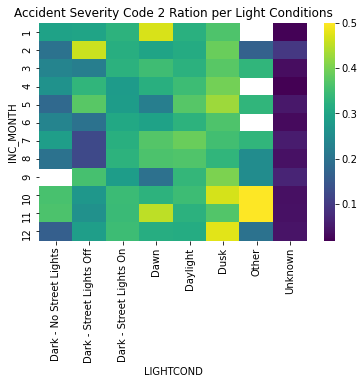

In [77]:
lightcondMonth_1 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)].groupby(by=['INC_MONTH','LIGHTCOND']).count()['INCKEY'].unstack()
lightcondMonth_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['INC_MONTH','LIGHTCOND']).count()['INCKEY'].unstack()

sns.heatmap(lightcondMonth_2/(lightcondMonth_1+lightcondMonth_2),cmap='viridis')
plt.title('Accident Severity Code 2 Ration per Light Conditions')

#### Spatial Distribution

In this section we will analyse the data spatial distribution. This information is provided in the following features:

* X', 'Y', LOCATION, ADDRESSTYPE

<AxesSubplot:xlabel='X', ylabel='Y'>

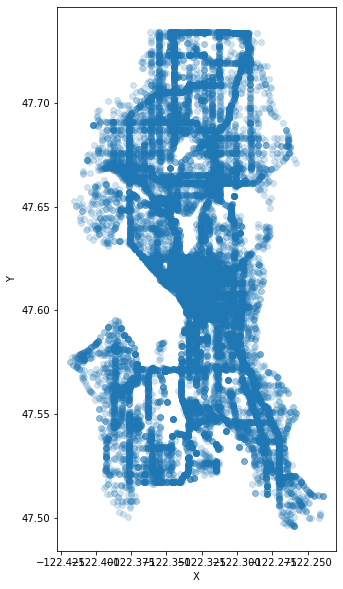

In [172]:
plt.figure(figsize=(5,10))
sns.scatterplot(data=df[(df['INC_YEAR'].isin(filter_year))],x='X',y='Y',edgecolor=None,alpha=0.2)

X and Y coordinates recorded in the data are for the closest reference point which are either the middle of a city block or the closest intersection.
This grid pattern can be seen in the following map.

In [173]:
# get random 'limit' records in the dataframe
limit = 1000
df_incidents = df.sample(n=limit)

latitude = 47.606
longitude = -122.33

world_map = folium.Map(location=[latitude, longitude], min_zoom=16, max_zoom=16)
incidents = folium.map.FeatureGroup()
for lat, lng, in zip(df_incidents.Y, df_incidents.X):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10,
            color=None,
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
world_map.add_child(incidents)

Distribution of accidents per type of address:

In [170]:
df['ADDRTYPE'].value_counts()

Block           121023
Intersection     63144
Name: ADDRTYPE, dtype: int64

Accidents with injuries happen at intersections as often as between them. However, accidents without injuries approximately triple in volume for locations between intersections. 

This may provide a good distinctive characteristic for the prediction.

In [174]:
addrtype_count = df[['ADDRTYPE','SEVERITYCODE','INCKEY']].groupby(by=['ADDRTYPE','SEVERITYCODE']).count()

print ('SEVERITYCODE2-to-SEVERITYCODE1 Ratio for ADDRTYPE=Block: ',
       np.round(addrtype_count.loc['Block'].loc[2]['INCKEY']/addrtype_count.loc['Block'].loc[1]['INCKEY'],2))
print ('SEVERITYCODE2-to-SEVERITYCODE1 Ratio for ADDRTYPE=Intersection: ',
       np.round(addrtype_count.loc['Intersection'].loc[2]['INCKEY']/addrtype_count.loc['Intersection'].loc[1]['INCKEY'],2))
addrtype_count

SEVERITYCODE2-to-SEVERITYCODE1 Ratio for ADDRTYPE=Block:  0.31
SEVERITYCODE2-to-SEVERITYCODE1 Ratio for ADDRTYPE=Intersection:  0.76


INCKEY
ADDRTYPE     SEVERITYCODE        
Block        1              92284
             2              28739
Intersection 1              35870
             2              27274

There may be some differences  with regard to the frequency of accidents with injuries in different areas of Seattle. The following two plots show the volume of accidents of different severity in a form of hex plot.

From the comparison some differences can be observed in different areas. However, these differences are not obvious.



<function matplotlib.pyplot.show(close=None, block=None)>

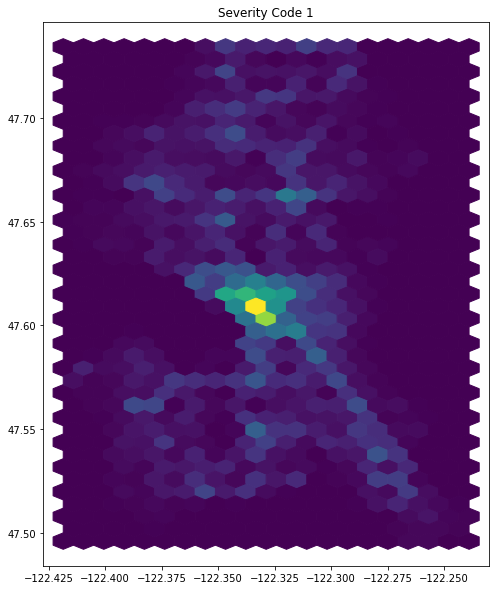

In [176]:
plt.figure(figsize=(8,10))
plt.hexbin(data=df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==1)], x='X',y='Y', gridsize=(20,20))
plt.title('Severity Code 1')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

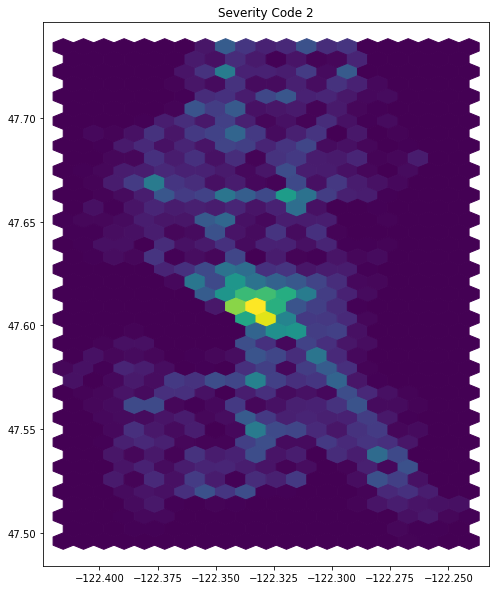

In [177]:
plt.figure(figsize=(8,10))
plt.hexbin(data=df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)], x='X',y='Y', gridsize=(20,20))
plt.title('Severity Code 2')
plt.show

The following map shows how much different locations differ with regard to frequency of accidents with injuries.

In [179]:
#Group df by X and Y and count all SEVERITYCODE events and events where the code is 2

df_int = df[df['INC_YEAR'].isin(filter_year)].groupby(by=['X','Y']).count()
df_int = df_int['SEVERITYCODE']
df_int=df_int.reset_index()
df_int.head()

df_int_2 = df[(df['INC_YEAR'].isin(filter_year))&(df['SEVERITYCODE']==2)].groupby(by=['X','Y']).count()
df_int_2 = df_int_2['SEVERITYCODE']
df_int_2=df_int_2.reset_index()
df_int_2=df_int_2.rename(columns = {'SEVERITYCODE':'SEVERITYCODE_2'})
df_int=pd.merge(df_int,df_int_2,on=['X','Y'])

#df_int.head(1)

In [180]:
#import branca

df_incidents = df_int

latitude = 47.606
longitude = -122.33
colorscale = branca.colormap.linear.PuRd_09.scale(0, 100)

world_map = folium.Map(location=[latitude, longitude], min_zoom=16, max_zoom=16)
incidents = folium.map.FeatureGroup()
for lat, lng, value,value_2 in zip(df_incidents.Y, df_incidents.X, df_incidents.SEVERITYCODE,df_incidents.SEVERITYCODE_2):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=20*value_2/value,
            color=None,
            fill=True,
            fill_color=colorscale(100*value_2/value),
            fill_opacity=0.8
        )
    )

world_map.add_child(incidents)

Different size of the points emphasised  by their colour indicates variation in the proportion of Code 2 in the total number of events at different locations.

### Clustering

Analysis of the spatial distribution of events indicates that it may provide some additional inside for the classification. One such categorical feature is ADDRTYPE. We will use it with some modifications. 

The X/Y coordinates cannot be used directly for classification due to their granularity - there are too many coordinate points to allow learning for the models. Some sort of aggregated view is required. It can be based on using a relatively coarse grid based on for example the city's district segregation. 

Due to the limited nature of this project we do not use such approach. Instead emulate grid by generating a set of clusters using the whole dataset. then every X/Y point in the dataset is assigned to a cluster and its identification number is used as an additional feature for training and then for testing. 

In [182]:
df_clustering=df[['X','Y']]
df_clustering.drop_duplicates(inplace=True)
#print(df_clustering.shape)

C:\Users\Artemi\.conda\envs\MyEnvironment\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Attribute num_clust specifies the number of clusters to be generated. No specific optimisation of the number was performed. A course iterative tuning showed that increasing the number of clusters above 300...500 does not bring any significant changes to the classification.  

In [183]:
#from sklearn.cluster import KMeans
num_clust = 500
k_means=KMeans(init='k-means++', n_clusters=num_clust, n_init=12)
k_means.fit(df_clustering)


k_means_labels = np.reshape(k_means.labels_,(len(k_means.labels_),1))
df_clustering['cluster_id'] = k_means_labels
labels= df_clustering['cluster_id'].unique()
#labels

C:\Users\Artemi\.conda\envs\MyEnvironment\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [188]:
print(len(labels),' clusters have been generated')

500  clusters have been generated


The following map visualises the clusters.

In [192]:
X = df_clustering

#Seatle coordinates to position the map
latitude = 47.606
longitude = -122.33

#zoom is fixed by setting min_zoom=max_zoom
world_map = folium.Map(location=[latitude, longitude], min_zoom=11, max_zoom=11, tiles='CartoDB positron',zoom_control=False)
color_dict = {0: 'red', 1: 'yellow',2: 'blue', 3: 'green',
4: 'purple', 5: '#ff69b4', 6: 'black', 7: 'cyan', 8: 'magenta', 9: '#faebd7',
10: '#2e8b57', 11: '#eeefff', 12: '#da70d6', 13: '#ff7f50', 14: '#cd853f',
15: '#bc8f8f', 16: '#5f9ea0', 17: '#daa520',18:'#ad36ad',19:'#ff7f50'}

colorscale = branca.colormap.linear.PuRd_09.scale(0, 10)

for clust in labels:
    if clust==-1:
        c='black'
    else:
        c=color_dict[clust%20]
    for  lat, long in zip(X[X['cluster_id']==clust]['Y'],X[X['cluster_id']==clust]['X']):
        folium.Circle(
        location=[lat, long],
        radius=50,
        fill=True,
        color=None,
        fill_color=c,
        fill_opacity=0.8
        
    ).add_to(world_map)

world_map

### Feature Selection

Now, after a detailed analysis we can finalise features that will be used for the prediction.

In [193]:
#do not select Road Conditions as they cannnot be known
model_features=['SEVERITYCODE', 'X', 'Y','WEATHER', 'LIGHTCOND', 'ROADCOND','INC_YEAR','INC_MONTH','INC_WEEK'
                , 'INC_DAYOFWEEK', 'INC_HOUR','ADDRTYPE']

We extract records for the selected features from the original data set limiting the slice to four years as discussed previously - from 2017 to 2019. Data for 2020 are added as well. the purpose of this addition is explained in the following section. 

In [194]:
df_model=df[df['INC_YEAR'].isin([2017,2018,2019,2020])][model_features]
df_model.reset_index(inplace=True,drop=True)
print(df_model.shape)
df_model.head(1)

(29706, 12)


,SEVERITYCODE,X,Y,WEATHER,LIGHTCOND,ROADCOND,INC_YEAR,INC_MONTH,INC_WEEK,INC_DAYOFWEEK,INC_HOUR,ADDRTYPE
0,1,-122.387598,47.690575,Clear,Daylight,Dry,2019,4,16,5,17,Intersection


An id of a cluster corresponding to X/Y coordinates is added from the reference data frame df_clustering.

In [195]:
df_model=pd.merge(df_model,
                 df_clustering,
                 how='left', 
                 left_on=['X','Y'], 
                 right_on=['X','Y'])

In [196]:
print(df_model.shape)
df_model.head(1)

(29706, 13)


,SEVERITYCODE,X,Y,WEATHER,LIGHTCOND,ROADCOND,INC_YEAR,INC_MONTH,INC_WEEK,INC_DAYOFWEEK,INC_HOUR,ADDRTYPE,cluster_id
0,1,-122.387598,47.690575,Clear,Daylight,Dry,2019,4,16,5,17,Intersection,178


We reset the index and save the current state of the data frame to simplify running this notebook.

In [197]:
df_model.reset_index(inplace=True,drop=True)
df_model.to_csv('Data-Collisions_processed_stage_2.csv',index=False)

### Feature Design

We reload the processed data set

In [199]:
df_model = pd.read_csv('Data-Collisions_processed_stage_2.csv')
df_model.head()

,SEVERITYCODE,X,Y,WEATHER,LIGHTCOND,ROADCOND,INC_YEAR,INC_MONTH,INC_WEEK,INC_DAYOFWEEK,INC_HOUR,ADDRTYPE,cluster_id
0,1,-122.387598,47.690575,Clear,Daylight,Dry,2019,4,16,5,17,Intersection,178
1,2,-122.320780,47.614076,Clear,Daylight,Dry,2020,4,16,2,17,Intersection,95
2,2,-122.328270,47.571420,Clear,Daylight,Dry,2020,4,16,4,14,Block,216
3,2,-122.312857,47.599218,Clear,Daylight,Dry,2019,4,17,3,9,Block,174
4,1,-122.318741,47.676567,Raining,Daylight,Wet,2019,4,17,5,13,Block,55


We can check four categorical features in the set.

In [200]:
df_model['WEATHER'].value_counts()

Clear                       18894
Raining                      5247
Overcast                     4277
Unknown                       829
Snowing                       179
Fog/Smog/Smoke                124
Other                         105
Blowing Sand/Dirt              20
Sleet/Hail/Freezing Rain       17
Severe Crosswind                9
Partly Cloudy                   5
Name: WEATHER, dtype: int64

In [201]:
df_model['LIGHTCOND'].value_counts()

Daylight                    19446
Dark - Street Lights On      7632
Dusk                          926
Unknown                       743
Dawn                          471
Dark - No Street Lights       269
Dark - Street Lights Off      164
Other                          44
Dark - Unknown Lighting        11
Name: LIGHTCOND, dtype: int64

In [202]:
df_model['ROADCOND'].value_counts()

Dry               20710
Wet                7731
Unknown             888
Snow/Slush          171
Ice                 156
Other                22
Standing Water       13
Oil                   9
Sand/Mud/Dirt         6
Name: ROADCOND, dtype: int64

In [204]:
df_model['ADDRTYPE'].value_counts()

Block           17725
Intersection    11981
Name: ADDRTYPE, dtype: int64

Some regularisation is applied to reduce the number of dummy features that will be created.

In [205]:
#Replacing values for WEATHER
old_value= ['Fog/Smog/Smoke', 
            'Other',
            'Sleet/Hail/Freezing Rain',
            'Severe Crosswind', 
            'Partly Cloudy', 
            'Blowing Sand/Dirt']
new_value=['Other_Dangerous',
           'Other_Dangerous', 
           'Other_Dangerous', 
           'Other_Dangerous', 
           'Other_Dangerous', 
           'Other_Dangerous']

In [206]:
df_model['WEATHER'].replace(to_replace=old_value,value=new_value, inplace=True)

In [207]:
df_model['WEATHER'].value_counts()

Clear              18894
Raining             5247
Overcast            4277
Unknown              829
Other_Dangerous      280
Snowing              179
Name: WEATHER, dtype: int64

In [208]:
#Replacing values for LIGHTCOND
old_value= ['Daylight', 'Dark - Street Lights On', 'Dusk', 'Unknown', 'Dawn',
       'Dark - Unknown Lighting', 'Dark - Street Lights Off',
       'Dark - No Street Lights', 'Other']
new_value=['Daylight', 'Dark', 'Dusk', 'Unknown', 'Dawn',
       'Dark', 'Dark',
       'Dark', 'Unknown']

In [209]:
df_model['LIGHTCOND'].replace(to_replace=old_value,value=new_value, inplace=True)

In [210]:
df_model['LIGHTCOND'].value_counts()

Daylight    19446
Dark         8076
Dusk          926
Unknown       787
Dawn          471
Name: LIGHTCOND, dtype: int64

In [211]:
#Replacing values for ROADCOND
old_value= ['Dry', 'Wet', 'Unknown', 'Snow/Slush', 'Ice', 'Other',
       'Sand/Mud/Dirt', 'Oil', 'Standing Water']
new_value=['Dry', 'Wet', 'Unknown', 'Other_Dangerous', 'Other_Dangerous', 'Other_Dangerous',
       'Other_Dangerous', 'Other_Dangerous', 'Other_Dangerous']

In [212]:
df_model['ROADCOND'].replace(to_replace=old_value,value=new_value, inplace=True)

In [214]:
df_model['ROADCOND'].value_counts()

Dry                20710
Wet                 7731
Unknown              888
Other_Dangerous      377
Name: ROADCOND, dtype: int64

We create the new dummy features for the categorical feature and drop one from each group to avoid multi-collinearity.

In [215]:
df_model  = pd.get_dummies(data=df_model,
              columns=['WEATHER'],
              drop_first=False)

df_model  = pd.get_dummies(data=df_model,
              columns=['LIGHTCOND'],
              drop_first=False)

df_model  = pd.get_dummies(data=df_model,
              columns=['ROADCOND'],
              drop_first=False)

df_model  = pd.get_dummies(data=df_model,
              columns=['ADDRTYPE'],
              drop_first=False)

In [216]:
df_model.drop(['WEATHER_Clear','LIGHTCOND_Daylight','ROADCOND_Dry','ADDRTYPE_Block'],axis=1,inplace=True)
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29706 entries, 0 to 29705
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SEVERITYCODE              29706 non-null  int64  
 1   X                         29706 non-null  float64
 2   Y                         29706 non-null  float64
 3   INC_YEAR                  29706 non-null  int64  
 4   INC_MONTH                 29706 non-null  int64  
 5   INC_WEEK                  29706 non-null  int64  
 6   INC_DAYOFWEEK             29706 non-null  int64  
 7   INC_HOUR                  29706 non-null  int64  
 8   cluster_id                29706 non-null  int64  
 9   WEATHER_Other_Dangerous   29706 non-null  uint8  
 10  WEATHER_Overcast          29706 non-null  uint8  
 11  WEATHER_Raining           29706 non-null  uint8  
 12  WEATHER_Snowing           29706 non-null  uint8  
 13  WEATHER_Unknown           29706 non-null  uint8  
 14  LIGHTC

The data set is ready for modelling.

In [217]:
df_model.to_csv('Data-Collisions_processed_stage_3.csv',index=False)

### Modelling

In [231]:
df_model = pd.read_csv('Data-Collisions_processed_stage_3.csv')

#### Data Set Preparation

The modelling data set df_model is split two parts - Training-Test set and  Validation set. The Validation set will perform a role of 'never seen data'. Testing the models using this sate will emulate running the model in a production environment.

For the Validation set we will use data from January 2020.


In [232]:
print(df_model.shape)

(29706, 22)


In [233]:
features = ['SEVERITYCODE', 'INC_MONTH', 'INC_WEEK',
       'INC_DAYOFWEEK', 'INC_HOUR', 'cluster_id', 'WEATHER_Other_Dangerous',
       'WEATHER_Overcast', 'WEATHER_Raining', 'WEATHER_Snowing',
       'WEATHER_Unknown', 'LIGHTCOND_Dark', 'LIGHTCOND_Dawn', 'LIGHTCOND_Dusk',
       'LIGHTCOND_Unknown','ROADCOND_Other_Dangerous', 'ROADCOND_Unknown',
       'ROADCOND_Wet','ADDRTYPE_Intersection']

In [234]:
df_traintest = df_model[df_model['INC_YEAR']<2020][features]

In [235]:
df_validate = df_model[(df_model['INC_YEAR']==2020)&(df_model['INC_MONTH']==1)][features]

In [236]:
print(df_traintest.shape)
print(df_validate.shape)

(28463, 19)
(591, 19)


In [237]:
df_traintest.to_csv('Data-Collisions_processed_stage_4_traintest.csv',index=False)
df_validate.to_csv('Data-Collisions_processed_stage_4_validate.csv',index=False)

### Classification

The data set (df_traintest) is prepared by:
* Train - test split
* SMOTE Transformation. This step is introduced to account for an uneven distribution of labels in the data set. Due to the project's limited nature we do not discuss here merits of different techniques used to balance datasets. 
* Normalisation by a Standard Scaler

In [238]:
df_traintest = pd.read_csv('Data-Collisions_processed_stage_4_traintest.csv')

In [239]:
X = df_traintest.drop(['SEVERITYCODE'],axis=1)
y = df_traintest['SEVERITYCODE']

In [240]:
# Function to plot the Feature Importance

def f_importances(coef, names):
    imp = coef
    imp,names = zip(*zip(imp,names))
    plt.barh(range(len(names)), imp, align='center')
    plt.yticks(range(len(names)), names)
    plt.show()

#### Train-Test Split

In [241]:
#Train-Test split of the X set
#from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.25, random_state=4)
print(X_train.shape)
print(X_test.shape)

(21347, 18)
(7116, 18)


#### SMOTE Transformation

Note how the number of samples for different SEVERITYCODEs changes after the transformation.

In [242]:
print('SEVERITYCODE split before SMOTE: \n',np.unique(y_train,return_counts=True))
#from imblearn.over_sampling import SMOTE
#from imblearn.over_sampling import ADASYN

oversample = SMOTE(sampling_strategy='auto',k_neighbors=10)
#oversample = ADASYN()
X_train, y_train = oversample.fit_resample(X_train, y_train)
print('SEVERITYCODE split after SMOTE: \n',np.unique(y_train,return_counts=True))

SEVERITYCODE split before SMOTE: 
 (array([1, 2], dtype=int64), array([14279,  7068], dtype=int64))
SEVERITYCODE split after SMOTE: 
 (array([1, 2], dtype=int64), array([14279, 14279], dtype=int64))


In [243]:
print('Train set shape: ',X_train.shape)


Train set shape:  (28558, 18)


### Modelling

Four models will be trained in this section:

* K Nearest Neighbour
* Decision Tree
* Support Vector Machine
* Logistic Regression 

To find the most optimum model parameters we use sklearn.model_selection.GreedSearch package. However, this report only shows results with the found parameters.

The results of the modelling are presented in a form of classification reports and bar charts showing relative importance of used features (excluding SVM where it is not possible for the used kernel)

In [245]:
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.transform(X_test)

#### K Nearest Neighbor (KNN)

In [246]:
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score
#from sklearn.model_selection import GridSearchCV

In [247]:
k=1
knn = KNeighborsClassifier(metric='manhattan',n_neighbors=k).fit(X_train,y_train)
yhat= knn.predict(X_test)

print(classification_report(y_test, yhat))

              precision    recall  f1-score   support

           1       0.68      0.59      0.63      4718
           2       0.36      0.45      0.40      2398

    accuracy                           0.54      7116
   macro avg       0.52      0.52      0.52      7116
weighted avg       0.57      0.54      0.55      7116



In [248]:
#Calculated on the Test set to speed it up
from sklearn.inspection import permutation_importance
results = permutation_importance(knn, X_test, y_test, scoring='accuracy')

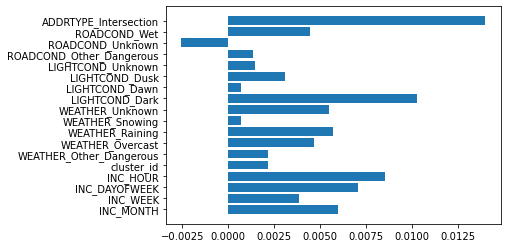

In [249]:
# get importance
importance_knn = results.importances_mean
f_importances(importance_knn, features[1:])

Note: The weights obtained from importances_mean represent the vector coordinates which are orthogonal to the hyperplane and their direction indicates the predicted class.


#### Decision Tree

In [250]:
#from sklearn.tree import DecisionTreeClassifier

In [251]:
destree = DecisionTreeClassifier(criterion="entropy", max_depth =200,max_features='auto')
destree.fit(X_train,y_train)
yhat = destree.predict(X_test)

print (classification_report(y_test, yhat))

              precision    recall  f1-score   support

           1       0.68      0.58      0.63      4718
           2       0.36      0.46      0.41      2398

    accuracy                           0.54      7116
   macro avg       0.52      0.52      0.52      7116
weighted avg       0.57      0.54      0.55      7116



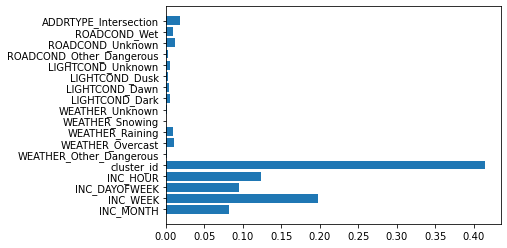

In [252]:
# get importance
importance_destree = destree.feature_importances_
f_importances(importance_destree, features[1:])

#### Support Vector Machine

In [253]:
#from sklearn.svm import SVC

vmm=SVC(C=10, gamma=0.01, kernel='sigmoid')
#vmm=SVC(kernel='linear')
vmm.fit(X_train,y_train)
yhat=vmm.predict(X_test)

print (classification_report(y_test, yhat))

              precision    recall  f1-score   support

           1       0.69      0.43      0.53      4718
           2       0.35      0.62      0.45      2398

    accuracy                           0.49      7116
   macro avg       0.52      0.52      0.49      7116
weighted avg       0.57      0.49      0.50      7116



In [254]:
#The weights obtained from svm.coef_ represent the vector coordinates which are orthogonal to the hyperplane and their direction indicates the predicted class.
# get importance
#importance_vmm = vmm.coef_[0]
#f_importances(importance_vmm, features[1:])

#### Logistic Regression

In [266]:
#from sklearn.linear_model import LogisticRegression
weights='balanced'
lr=LogisticRegression(C=0.00001, class_weight=weights, solver='newton-cg'
                      ,max_iter=500)
lr.fit(X_train,y_train)
yhat = lr.predict(X_test)


print (classification_report(y_test, yhat))

              precision    recall  f1-score   support

           1       0.70      0.47      0.57      4718
           2       0.37      0.60      0.45      2398

    accuracy                           0.52      7116
   macro avg       0.53      0.54      0.51      7116
weighted avg       0.59      0.52      0.53      7116



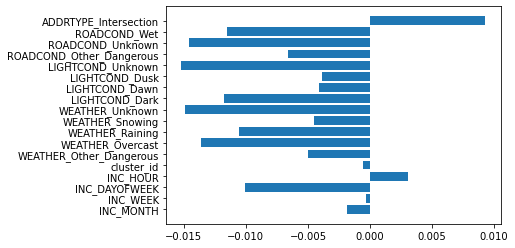

In [256]:
# get importance
importance_lr = lr.coef_[0]
f_importances(importance_lr, features[1:])

Note: The weights obtained from coef_ represent the vector coordinates which are orthogonal to the hyperplane and their direction indicates the predicted class.

### Validation with previously unseen data

We now test the trained models using 'previously unseen data' from January 2020. Thus we emulate the real world situation where a model is train on historical data and then applied to data obtained after the training. 

In [257]:
#Define a function to print out the evaluation results
def model_classification_report(y_true,y_pred,label_1,label_2):
    print('Model Classification Report \n')
    print (classification_report(y_true=y_true, y_pred=y_pred),'\n')
    print('Model Evaluation Scores\n')
    print("Accuracy: ", accuracy_score(y_val, yhat_val_knn),'\n')

    print("Jaccard Micro Score: ", jaccard_score(y_true=y_true, y_pred=y_pred, average='micro'))
    print("Jaccard Macro Score: ", jaccard_score(y_true=y_true, y_pred=y_pred, average='macro'))
    print("Jaccard Weighted Score: ", jaccard_score(y_true=y_true, y_pred=y_pred, average='weighted'))

    print("Jaccard Binary Score for ",label_1,': ', jaccard_score(y_true=y_true, y_pred=y_pred, pos_label = label_1,average='binary'))
    print("Jaccard Binary Score for ",label_2,': ', jaccard_score(y_true=y_true, y_pred=y_pred, pos_label = label_2,average='binary'),'\n')

    print("F1 Score for ",label_1,': ', f1_score(y_true=y_true, y_pred=y_pred, pos_label = label_1))
    print("F1 Score for ",label_2,': ', f1_score(y_true=y_true, y_pred=y_pred, pos_label = label_2),'\n')
    
    #Print confusion matrix
    confusion = pd.crosstab(y_true,
           y_pred,
           rownames=['Actual'],
           colnames=['Predicted'],
           margins=False)
    plt.title("Confusion Matrix", fontsize =20)
    plot=sns.heatmap(data=confusion,
            cmap='coolwarm',
            annot=True,
           square =True)


In [258]:
df_validate = pd.read_csv('Data-Collisions_processed_stage_4_validate.csv')

In [259]:
X_val = df_validate.drop(['SEVERITYCODE'],axis=1)
y_val = df_validate['SEVERITYCODE']

In [260]:
ss2=StandardScaler()
X_val = ss2.fit_transform(X_val)

In [261]:
yhat_val_knn= knn.predict(X_val)
yhat_val_destree= destree.predict(X_val)
yhat_val_vmm= vmm.predict(X_val)
yhat_val_lr= lr.predict(X_val)

#### Validation of K Nearest Neighbour Model

Model Classification Report 

              precision    recall  f1-score   support

           1       0.74      0.58      0.65       415
           2       0.34      0.52      0.41       176

    accuracy                           0.56       591
   macro avg       0.54      0.55      0.53       591
weighted avg       0.62      0.56      0.58       591
 

Model Evaluation Scores

Accuracy:  0.560067681895093 

Jaccard Micro Score:  0.3889541715628672
Jaccard Macro Score:  0.36962962962962964
Jaccard Weighted Score:  0.41426333270664906
Jaccard Binary Score for  1 :  0.48
Jaccard Binary Score for  2 :  0.25925925925925924 

F1 Score for  1 :  0.6486486486486487
F1 Score for  2 :  0.41176470588235303 



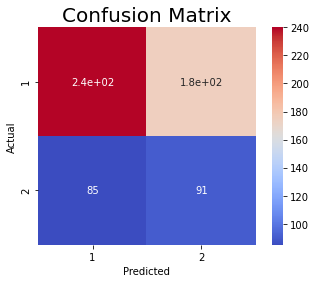

In [262]:
model_classification_report(y_val,yhat_val_knn,1,2)

#### Validation of Decision Tree Model

Model Classification Report 

              precision    recall  f1-score   support

           1       0.69      0.63      0.66       415
           2       0.27      0.33      0.30       176

    accuracy                           0.54       591
   macro avg       0.48      0.48      0.48       591
weighted avg       0.57      0.54      0.55       591
 

Model Evaluation Scores

Accuracy:  0.560067681895093 

Jaccard Micro Score:  0.36964078794901506
Jaccard Macro Score:  0.33271931320711806
Jaccard Weighted Score:  0.3961945335970345
Jaccard Binary Score for  1 :  0.4896810506566604
Jaccard Binary Score for  2 :  0.17575757575757575 

F1 Score for  1 :  0.6574307304785895
F1 Score for  2 :  0.29896907216494845 



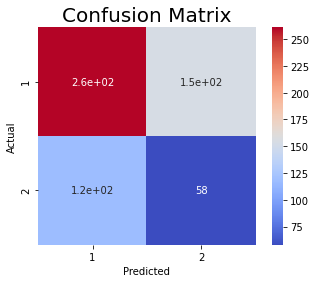

In [263]:
model_classification_report(y_val,yhat_val_destree,1,2)

#### Validation of SVM Model

Model Classification Report 

              precision    recall  f1-score   support

           1       0.70      0.85      0.77       415
           2       0.27      0.13      0.18       176

    accuracy                           0.64       591
   macro avg       0.48      0.49      0.47       591
weighted avg       0.57      0.64      0.59       591
 

Model Evaluation Scores

Accuracy:  0.560067681895093 

Jaccard Micro Score:  0.4665012406947891
Jaccard Macro Score:  0.35905876435081074
Jaccard Weighted Score:  0.4651812787744683
Jaccard Binary Score for  1 :  0.6214788732394366
Jaccard Binary Score for  2 :  0.09663865546218488 

F1 Score for  1 :  0.7665580890336591
F1 Score for  2 :  0.17624521072796934 



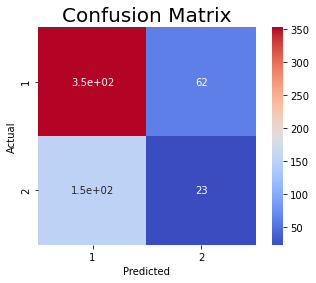

In [264]:
model_classification_report(y_val,yhat_val_vmm,1,2)

#### Validation of Logistic Regression Model

Model Classification Report 

              precision    recall  f1-score   support

           1       0.77      0.53      0.63       415
           2       0.36      0.62      0.46       176

    accuracy                           0.56       591
   macro avg       0.57      0.58      0.54       591
weighted avg       0.65      0.56      0.58       591
 

Model Evaluation Scores

Accuracy:  0.560067681895093 

Jaccard Micro Score:  0.3889541715628672
Jaccard Macro Score:  0.3783783783783784
Jaccard Weighted Score:  0.41116751269035534
Jaccard Binary Score for  1 :  0.4594594594594595
Jaccard Binary Score for  2 :  0.2972972972972973 

F1 Score for  1 :  0.6296296296296298
F1 Score for  2 :  0.4583333333333333 



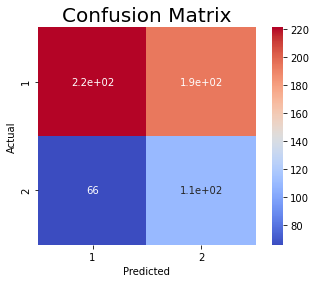

In [265]:
model_classification_report(y_val,yhat_val_lr,1,2)

## Results and Discussion

In the context of the project objective we aim to find a model that maximases detection of accidents with injuries. At the same time we want to avoid a large number of accidents without injuries to be classified otherwise. Thus it is a task of maximasing the recall for both classes.

Our analysis shows that none of the selected four models demonstrate sufficient quality of classification. In training all models demonstrated F1 score for class 2 (accidents with injuries) around 0.4...0.45. The subsequent validation using 'previously unseen data' confirmed the above result. 

This unsatisfactory result can be explained by absence of features with strong correlation for the target class. In other words none of the driving conditions, time periods of locations can be associated with a particular class.

We noted that importance of various features varied significantly in different models. This suggests that it may be possible to improve outcome of the classification by combining models into an ensemble, thus busting the quality. 

## Conclusion

In this project we aimed to create a model that would predict severity of a road traffic accident based on information available to the emergency services at the moment of the first call about the accident. We identified the relevant  features in the available data and prepared a set for model training and testing. We tuned and trained four different classification models. 

Based on the obtained results we concluded that in our opinion none of the models provides sufficient quality of classification. Thus we do not provide any recommendations with regard to deployment of any particular model.   

Having said that we have to note that the final decision on accepting the models into production is to be made by stakeholders based on specifics of the emergency response services and the corresponding monetary considerations. 
